# ネットワークの可視化と分析

## ネットワーク分析とは

ネットワーク分析とは、モノゴト同士の関係性に着目したネットワークを構成して、その特徴を分析するというものです。我々の身近にあるモノゴトは様々な属性で表現できます。例えば、自分のことを考えてみると、名前があり、年齢があり、住所があるなど、自分というものを表現するための属性情報を持っています。一般的な分析では、属性情報を対象とした統計的特徴を得ることが目的ですが、ネットワーク分析では、その属性を用いて事物の関係性を利用してネットワークを構築します。その関係性とは、年齢が近いとか、同じ地域に住んでいるとか、様々な関係を仮定してネットワークを構築することで、その関係性に基づいた異なるネットワークが構築されます。つまり、ネットワークとは、多元的な関係性をもとモノゴトの関係性の次元をネットワークという表現で次元を削除、もしくは写像しているといえます。その特定の次元平面に写像したネットワークのノードの構造的な立ち位置を数値として表現することを試みたものがネットワーク分析となります。

では、そのネットワークとはどのようなものなのかというと、人やモノゴトを想定したノードと、そのノード間のつながりを表すリンクから構成されたものになります。ノードやリンクには、他にも Vertex(バーテックス) や Edge(エッジ) と呼ばれることがありますが、これは、複雑系ネットワークの科学が、社会科学や物理学など複数の研究分野にまたがって発展してきた研究分野であるためです。ネットワークで構成された集合における、ノードやエッジの重要性を知るという目的は主に社会科学の分野で提案・調査されてきた内容ですが、計算機の能力の向上もあり、計算機科学や物理学の分野で大規模なネットワーク構造を扱うようになり、Googleの検索エンジンの基盤技術として用いられるようになりなったことで、2000年代前半に様々な研究者がとりくみ始めた分野になります。

本講では、ネットワーク分析のライブラリである NetworkX を用いて、どのような分析が可能であるかを紹介したいと思います。

## 準備: 日本語の出力

本講では、ネットワーク図の書き出しで英語以外を出力することがあるため、フォントのインストールなどの作業が必要です。以下を実行した後、ランタイムを再起動してください。

In [1]:
!apt-get -y install fonts-ipafont-gothic

Reading package lists... Done
Building dependency tree       
Reading state information... Done
fonts-ipafont-gothic is already the newest version (00303-18ubuntu1).
0 upgraded, 0 newly installed, 0 to remove and 13 not upgraded.


In [2]:
import matplotlib
matplotlib.get_cachedir()

'/root/.cache/matplotlib'

In [0]:
rm /root/.cache/matplotlib/fontList.json

## データの準備

まずは、ネットワーク分析の対象とするデータを準備します。準備するデータとしては、[SNAP(Stanford Network Analysis Project )](http://snap.stanford.edu/data/index.html)などで公開されているデータを利用してもよいですし、API を利用して集めても構いませんが、今回は、技術ブログサービスである Qiita の API を用いた tag を用いて、tag の共起(今回は同じ記事に出現している関係)ネットワークを対象としたいと思います。

In [4]:
!pip install pyprind
import pyprind

In [5]:
import requests
import json
import collections
import itertools
import networkx as nx
%matplotlib inline
import matplotlib.pyplot as plt

items = []
N=50
params = {"page":1, "per_page":100}

pbar = pyprind.ProgBar(N)

for i in range(N):
  params["page"] = i + 1
  res = requests.get("https://qiita.com/api/v2/items", params=params)
  items.extend(json.loads(res.text))
  pbar.update()

0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:02:16


In [355]:
items[:2]

[{'body': 'QQ/微信860155399制作毕业证书，购买成绩单，购买假文凭，购买假学位证，制造假国外大学文凭、肆业证、毕业公证、毕业证明书、结业证、录取通知书、Offer、在读证明、雅思托福成绩单、假文凭、假毕业证、网上存档永久可查！\n★本公司一直专注于为英国、加拿大、美国、新西兰、澳洲、法国、德国、爱尔兰、意大利等国家各高校留学生办理教育部学历学位认证和留学回国人员证明，在认证业务上开创了良好的市场势头，一直占据了领先的地位，成为无数留学回国人员办理学历学位认证的首选。公司主要业务涉及：国（境）外学历学位认证咨询，留学归国人员证明办理咨询。基于国内鼓励留学生回国就业、创业的政策，以及大批留学生归国立业之大优势。本公司一直朝着智力密集型的方向转型，建立了一个专业化的由归国留学生组成的专业顾问团队为中心，公司核心部分包括：咨询服务部门、营销部门、运作部、顾问团队共同协作的服务体系。\n★业务选择办理准则★\n一、工作未确定，回国需先给父母、亲戚朋友看下文凭的情况，办理一份就读学校的毕业证文凭即可\n二、回国进私企、外企、自己做生意的情况，这些单位是不查询毕业证真伪的，而且国内没有渠道去查询国外文凭的真假，也不需要提供真实教育部认证。鉴于此，办理一份毕业证即可\n三、进国企，银行，事业单位，考公务员等等，这些单位是必需要提供真实教育部认证的，办理教育部认证所需资料众多且烦琐，所有材料您都必须提供原件，我们凭借丰富的经验，快捷的绿色通道帮您快速整合材料，让您少走弯路。\n★关于教育部学历认证的小知识：\n国外学历学位认证，作为留学生回国后就业、落户、升学必须提交的证明材料，国家虽然没有明文的规定，留学生回国后必须办理，属于自愿行为，不强制要求。但是根据国家部委和国务院学位办的相关规定：留服认证是留学生回国报考公务员，进入国家机关、事业单位，高等教育考试，大型外企等入职时必须提供的国外文凭的证明材料，不仅关系着留学生回国后的就业，更是影响着落户、升学，甚至留学生往后申请海外高层次人才科研启动基金的有力凭据。\n\u3000\u3000国外学历学位认证的办理并不难，只要按照要求准备材料，一次性提交材料，很容易通过认证，只是因为认证的时间比较长，所以建议留学生回国后，就应立即着手办理国外学历学位认证。\n\u3000\u3000但是也有一些马虎的童鞋，不小心将认证

上記コードを実行した際に、JSON形式のメタデータが表示されない場合、API の制限にかかってしまっています。Qiita をはじめとした Web API では、その多くに接続制限が定められており、Qiita の場合 anonymous (ユーザ登録なし)での接続は IP につき 60/hour となっています。そのため、上記のコードを、複数のユーザが同時に動かすことは無理な可能性がありますので、別途読込ファイルを準備しました。

上記コードでダウンロードしたデータは、json 形式であったものを辞書型データに変換してたものが保存されています。このJSONデータには様々な属性情報が含まれていますが、今回使用するのは tag 情報の名前だけになるので、tag キーをもつデータを呼び出し、その中に含まれる name キーを持つ情報を取り出して、リストにします。

In [0]:
tags_list = []
i = 0
for item in items:
  if isinstance(item, dict):
    tags = [tag["name"] for tag in item["tags"]]
  tags_list.append(tags)

上記コードを実行してタグのリストの先頭５つだけ表示すると以下のタグ情報が含まれていることがわかります。

In [376]:
tags_list[:5]

[['asaas'],
 ['毕业证书'],
 ['宾州州立大学学位证成绩单帕克分校文凭毕业证'],
 ['vs', 'Nets', 'Raptors'],
 ['google', 'SEO', '検索']]

### タグデータの書き出し

タグリスト(tags_list)に保存されたデータを、CSV形式のデータとして書き出します。このコードは、実行する必要は特にありません。

In [0]:
import numpy as np
import csv

with open("qiita_metadata.csv","wt") as f:
  writer = csv.writer(f, lineterminator='\n')
  writer.writerows(tags_list)

### タグデータの読み込み
Qiita API の実行が、接続制限などで動作しなかった場合には、こちらでファイルを読み込んで実行を続けます。

In [0]:
tags_list = []
with open("qiita_metadata.csv", "r") as f:
  reader = csv.reader(f)
  for row in reader:
    tags_list.append(row)

### ノードとするタグ数の制限

取得したノードの多くは１回程度の出力であり、このリストをそのまま使用するとノード数が膨大になってネットワーク図を表示したときに、ごちゃごちゃするため、出現回数が多い順に50個のtagに絞ります。そのために、collections.Counter を使ってタグの出現回数を個数を数え、most_common 関数を使用して、個数を制限することにします。

In [0]:
import collections
import itertools

tag_count = collections.Counter(itertools.chain.from_iterable(tags_list)).most_common(50)

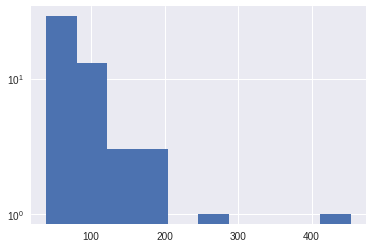

In [10]:
import matplotlib.pyplot as plt

plt.hist(dict(tag_count).values())
plt.yscale('log')


In [11]:
tag_count

[('Python', 453),
 ('JavaScript', 280),
 ('Ruby', 188),
 ('PHP', 169),
 ('AWS', 164),
 ('Python3', 158),
 ('Rails', 148),
 ('Linux', 141),
 ('docker', 116),
 ('Unity', 107),
 ('C#', 98),
 ('Mac', 97),
 ('Java', 93),
 ('iOS', 92),
 ('vue.js', 91),
 ('Swift', 90),
 ('GitHub', 90),
 ('Node.js', 85),
 ('Android', 85),
 ('Git', 82),
 ('機械学習', 81),
 ('Ubuntu', 76),
 ('初心者', 74),
 ('DeepLearning', 70),
 ('RaspberryPi', 70),
 ('Qiita', 62),
 ('RubyOnRails', 61),
 ('Go', 59),
 ('laravel', 57),
 ('C++', 57),
 ('MySQL', 57),
 ('Linuxコマンド', 56),
 ('React', 56),
 ('Django', 55),
 ('TypeScript', 54),
 ('kubernetes', 53),
 ('vs', 51),
 ('golang', 51),
 ('Kotlin', 49),
 ('Windows', 48),
 ('UI', 48),
 ('C', 47),
 ('HTML', 47),
 ('TensorFlow', 45),
 ('UX', 41),
 ('Xcode', 40),
 ('Firebase', 40),
 ('Windows10', 39),
 ('Twitter', 39),
 ('Keras', 39)]

## ネットワークの可視化

本節では、上記で取得したQiitaのタグのネットワークが、どのような関係であるのかを視覚的に理解できるよう。可視化を行います。要素同士がどのような関係であるのかを視覚的に理解しやすいのもネットワーク分析の特徴のひとつになります。

### ネットワーククラスのインスタンス宣言

タグのネットワークを作るにあたり、NetworkX モジュールの Graph クラスを利用します。
```
 import networkx as nx
 
 g = nx.Graph()
```

### ノードの追加
上記のコードを実行することで、空のグラフが生成されます。そこに、add_nodes_from で引数に与えたリストのノードを追加します。

ネットワークの種類、生成に関しては、NetworkX モジュールのチュートリアルに詳しく紹介されており、本資料の最後にもその説明を加えていますので、そちらを参照してください。[NetworkX チュートリアル](#tutorial)

In [0]:
import networkx as nx

g = nx.Graph()
g.add_nodes_from([(tag,{"count":count}) for tag, count in tag_count])

### リンクの追加

つづいて、ノード間にリンクを張ります。今回は、同じ記事に使われたタグの間にリンクを張るため、itertools.combinations でタグの組みを取り出して、add_edge でリンクを追加します。その際、すでにリンクが存在していたら、'weight' 属性を１足すことで、出現頻度もカウントします。

なお、ネットワークを構成する要素であるノードとその関係性を表すリンクには、様々な読み方があります。これは、ネットワーク分析の研究が複数の研究分野で発展していた名残になります。本講では、なるべくノードとリンクと表現しますが、NetworkX では Node と Edge として表現していますので、それを頭の隅においておいてください。

In [0]:
for tags in tags_list:
  for tag0, tag1 in itertools.combinations(tags, 2):
    if not g.has_node(tag0) or not g.has_node(tag1):
      continue
    if g.has_edge(tag0, tag1):
      g[tag0][tag1]["weight"] += 1
    else:
      g.add_edge(tag0, tag1, weight=1)

### ネットワークの描画
ノードの追加、リンクの追加が終わったことで、ネットワークデータは完成したので、それを一旦表示してみましょう。

NetworkX では、ネットワークの描画方法に関しては、複数種類用意されていますが、ここでは、ベーシックな matplotlib モジュールを用いた描画方法で描画します。ネットワークデータがあれば、何も考えなくても neworkx.draw 関数の引数にネットワークデータを保持する変数を与えれば、表示できますが、ここでは、見やすさも考慮して表示します。

ネットワーク図を表示するうえで重要なのがノードをどこに表示するかになります。当たり前のことですが、画像を表示するディスプレイは２次元座標になります。それに対して、ネットワークデータのノードには座標なんてものは存在しません。そのため、位置をどうするか定義する必要があります。

では、その位置はどのように定義したらいいでしょうか？簡単に思いつくのは、格子(Grid)状に表示、円状に表示、ランダムに表示などありますが、これでは、ネットワーク構造である意味が薄れでしまいます。ネットワーク構造をもとに位置情報を求める手法として開発されたアルゴリズムの一つがスプリングレイアウトになります。

スプリングレイアウトとは、ノードをつなぐリンクがばねにつながれていると想定して、そのノード同士の近さを２次元空間上で求める手法になります。この位置関係を求めるのは networkx.sprint_layout 関数になります。この関数で求めた位置をもとに、ノードを配置します。この位置と、ノードの大きさをタグの出現回数のリストを netowrkx.draw_networkx_nodes 関数の引数に渡すことで、ノードがまずは描画されます。

続いて、リンクもその出現回数に応じて太さを変えるためリンクの重みのリストを取得して、networkx.draw_networkx_edges 関数の属性に与えることで、リンクも描画され、コード実行後のネットワーク図の感性となります。

(-1.0358149609338312,
 1.1169305882460248,
 -0.8982967233771988,
 0.8613256915347582)

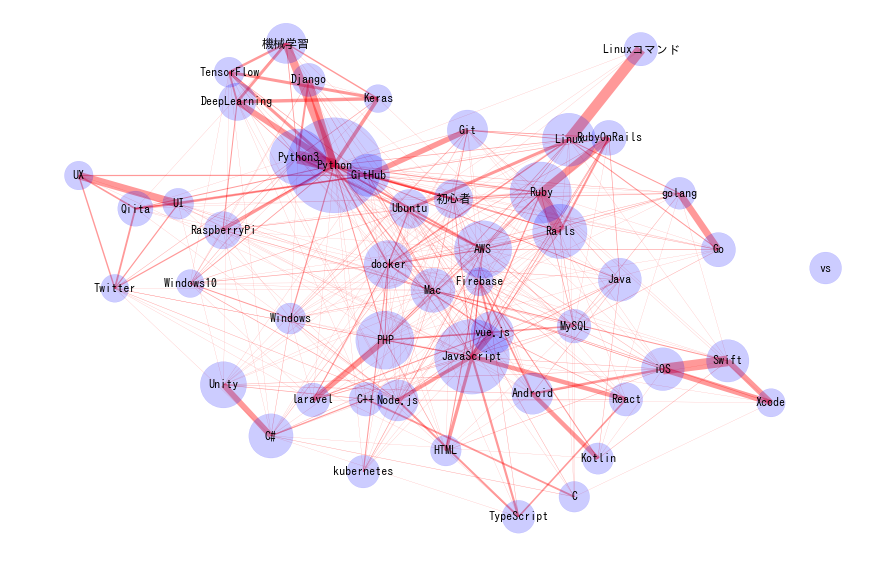

In [15]:
jp_font = {'fontname':'IPAGothic'}

plt.figure(figsize=(15,10))       # グラフのサイズを定義
pos = nx.spring_layout(g, k=1.5)  # ノード間の反発力を定義。値が小さいほど密集する

node_size = [ d['count']*20 for (n,d) in g.nodes(data=True)]          # ノードの大きさを調整
nx.draw_networkx_nodes(g, pos, node_color='b', alpha=0.2, node_size=node_size, font_weight="bold", font_family='VL Gothic') # ノードのスタイルを定義
nx.draw_networkx_labels(g, pos, fontsize=14, font_family='IPAGothic') # ノードのラベルに日本語を表示するにはフォントの指定が必要

edge_width = [ d['weight']*0.2 for (u,v,d) in g.edges(data=True)]           # エッジの太さを調整
nx.draw_networkx_edges(g, pos, alpha=0.4, edge_color='r', width=edge_width) # エッジのスタイルを定義

plt.axis('off')

## ネットワークの分析例: PageRank の計算

ネットワーク分析では、ノードの重要性を数値化した指標のことを中心性(Centrality)と呼びます。主な中心性としては、次数中心性、距離の中心性、媒介値中心性、PageRank中心性などがあります。この中心性には、ノードだけではなくエッジの重要性を示す指標も提案されております。今回は、goolgle の初期の検索エンジンで用いられたことで有名な PageRank 中心性を求めてみましょう。

PageRank とは、Web Page に人がどれだけ滞在している可能性が高いのかをリンクのつながり(ネットワークの構造)から求めることを想定した指標です。概念としては、ネットワーク上のノードに均等に訪問者が配置され、訪問者はリンクをランダムに移動していると仮定した状況で、各ノードにどれぐらいの確率で存在しているかと数値化したものになります。この計算モデルは厳密には PageRank とはことなり固有ベクトル中心性と呼ばれるものになりますが、PageRank では、一定の訪問者がリンクとは関係なくランダムなノードに移動すると想定した計算モデルになっています。

この PageRank の計算は、NetworkX モジュールでは pagerank() という関数で求めることが可能です

In [0]:
pagerank = nx.pagerank(g)

In [17]:
pagerank.values()

dict_values([0.07890368868099186, 0.045451906133795385, 0.03846953367834727, 0.023618040827536126, 0.021941964960406884, 0.032113469826055625, 0.027923293103332615, 0.03162900068324269, 0.02378802707449809, 0.017008759874438457, 0.020182816744389896, 0.018305376663548308, 0.009456130148573187, 0.03146761496108025, 0.021200131403890543, 0.026604894562113124, 0.022286681524543824, 0.018398082665933686, 0.019323761322390814, 0.01728203162440958, 0.02169618963613165, 0.01738237555151065, 0.020139597487873993, 0.02168748441176358, 0.011272894811938383, 0.015154609107655913, 0.019739522841361944, 0.01708864162024789, 0.017125284489588482, 0.011985438588829282, 0.01183515484164183, 0.017379799356333346, 0.013845742314746955, 0.014944500094420315, 0.012470573328074129, 0.006931826343989476, 0.0030518819938962364, 0.018811374344656906, 0.012960861053892095, 0.011948058406409187, 0.02230829618737309, 0.009138007495300282, 0.011949035407460215, 0.01760582825803465, 0.019975936989697362, 0.0185728

もとめた PageRank をもとに、ノードを描画するときの濃淡で、PageRank のグラフ上での分布を可視化してみましょう。ただし、濃淡は\[0:1]の値で PageRank も同様なので値の分布としては問題ありませんが、そのままでは薄すぎるため、\[0,0.8] の範囲の値の分布に変更して、ネットワーク図を見やすくします

In [0]:
def normalize(x, amin=0, amax=1):
    xmax = x.max()
    xmin = x.min()
    if xmin == xmax:
        return np.ones_like(x)
    return (((amax - amin) * (x - xmin) / (xmax - xmin) + amin))*0.8

In [19]:
import numpy as np

pagerank_norm = normalize(np.array(list(pagerank.values())))

print(pagerank_norm)

[0.8        0.44718802 0.37354577 0.21690884 0.19923146 0.30650912
 0.26231582 0.30139948 0.21870166 0.14720153 0.18067794 0.1608768
 0.06754484 0.29969736 0.19140743 0.24841083 0.20286715 0.16185456
 0.17161758 0.1500837  0.1966393  0.15114201 0.18022211 0.19654749
 0.08670605 0.12764603 0.17600257 0.14804404 0.14843051 0.09422116
 0.09263614 0.15111484 0.11384156 0.12543003 0.09933782 0.04092131
 0.         0.16621349 0.10450883 0.09382692 0.20309511 0.06418964
 0.09383722 0.15349874 0.178496   0.16369782 0.13457495 0.079479
 0.11039308 0.15475579]


(-1.1115160838495308,
 0.9139595611816148,
 -0.8864334487244261,
 1.0277435738382603)

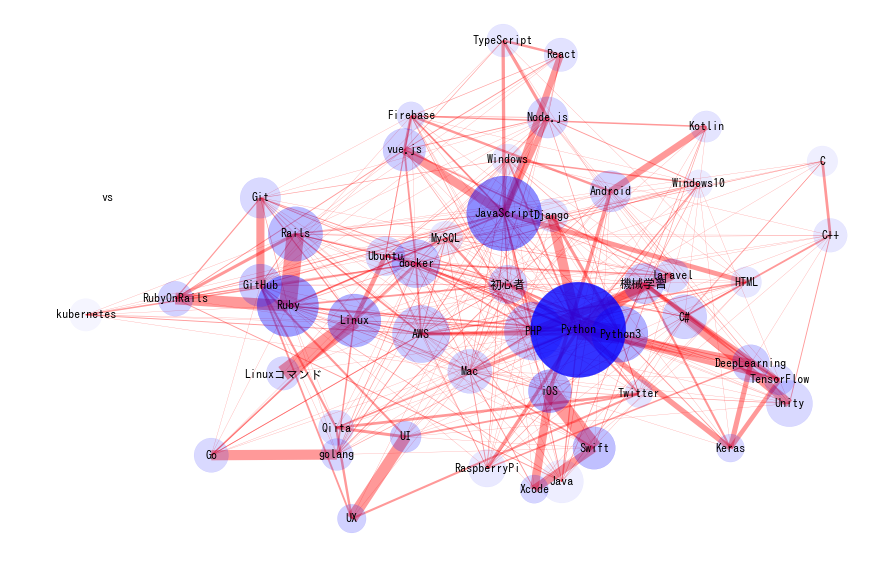

In [20]:
plt.figure(figsize=(15,10))       # グラフのサイズを定義
pos = nx.spring_layout(g, k=2)  # ノード間の反発力を定義。値が小さいほど密集する

node_size = [d['count']*20 for (n,d) in g.nodes(data=True)]          # ノードの大きさを調整
nx.draw_networkx_nodes(g, pos, node_color='b', alpha=pagerank_norm, node_size=node_size, font_weight="bold", font_family='VL Gothic') # ノードのスタイルを定義
nx.draw_networkx_labels(g, pos, fontsize=14, font_family='IPAGothic') # ノードのラベルに日本語を表示するにはフォントの指定が必要

edge_width = [ d['weight']*0.3 for (u,v,d) in g.edges(data=True)]           # エッジの太さを調整
nx.draw_networkx_edges(g, pos, alpha=0.4, edge_color='r', width=edge_width) # エッジのスタイルを定義

plt.axis('off')

この結果、Qiita の記事に含まれるタグをもとに記事が書かれている状況を鑑みると Python, JavaScript, Ruby 当たりの内容が注目されているということがわかります。ただし、注意が必要なのは、ここに出ているタグは、上位５０個のタグになるため、末端にあるノードのタグであっても多くの記事で使用されているタグであるということに留意してください。

## ネットワークの構造的特徴量
このような PageRank 中心性以外にも、NetworkX モジュールでは、ネットワークの特徴量を計算するための関数が用意されています。その際、ネットワーク全体の指標であるのか、ノードの指標であるのかの注意は必要です。

### ネットワーク全体の指標

#### 平均距離

平均距離とは、すべてのノード間の最短パスの長さの平均のことである。この距離が短いネットワークは、情報が届くまでのタイムラグが短いと考えられている。いわゆる、"Small World" として知られる、６人をたどればだれとでのつながるといわれるミリグラムの実験は、この平均距離を求めたものである。当然平均でしかなく、それ以上の人数が必要なことは多々ある。

この平均距離は、average_shortest_path 関数を用いて求めますが、ネットワーク全体の特徴量になるためネットワークのデータを引数に入れて求めます。その際、注意が必要なのは、すべてのノードが結合した状態でないと求めらられないため、孤立ノードがないか、ある場合はネットワークのノードから削除するか、最大コンポーネントを抽出する必要があります

In [0]:
isolated = [n for n in g.nodes if len([i for i in nx.all_neighbors(g, n)]) == 0]

In [0]:
for n in isolated:
  g.remove_node(n)

In [23]:
nx.average_shortest_path_length(g)

1.7227891156462585

#### クラスタリング係数

#### 次数平均

次数とは各ノードがもつリンクの個数のことである。その次数の平均が次数平均となる。次数平均を求める関数はないのかわからないので、以下の計算式で求める

$次数平均 d_{ave} = (リンク数*2)/(ノード数)$

リンク数に２を掛けているのは、リンクの両端にノードが付いているためである。これ以外にも、各ノードがもつ次数 degree をリストにして numpy.average 関数を用いて計算するという方法もある。

In [24]:
(nx.number_of_edges(g) * 2)/nx.number_of_nodes(g)

14.612244897959183

In [25]:
np.average([n for n in dict(nx.degree(g)).values()])


14.612244897959183

この次数には、ネットワークが双方向リンクである場合には上記で問題がないが、単方向リンクである場合には、リンクの方向を考慮する必要があるため、入力次数、出力次数も検討にいれる必要がある

### ノードの指標

#### 次数中心性(degree)

In [152]:
C_deg = nx.degree_centrality(g)
sorted(C_deg.items(), key=lambda x: x[1], reverse=True)[:5]

[('Python', 0.7083333333333333),
 ('Mac', 0.625),
 ('JavaScript', 0.5625),
 ('docker', 0.5625),
 ('初心者', 0.5625)]

#### 近接中心性(距離の中心性: closeness)

In [153]:
C_close = nx.closeness_centrality(g)
sorted(C_close.items(), key=lambda x: x[1], reverse=True)[:5]

[('Python', 0.7741935483870968),
 ('Mac', 0.7272727272727273),
 ('JavaScript', 0.6956521739130435),
 ('docker', 0.6956521739130435),
 ('初心者', 0.6956521739130435)]

#### 媒介中心性 (betweenness)

In [154]:
C_bet = nx.betweenness_centrality(g)
sorted(C_bet.items(), key=lambda x: x[1], reverse=True)[:5]

[('Python', 0.0991712770575679),
 ('Mac', 0.07665495615727788),
 ('JavaScript', 0.06247821451334638),
 ('初心者', 0.052523947009500666),
 ('docker', 0.0350361426996302)]

#### 固有ベクトル中心性

In [155]:
C_eigen = nx.eigenvector_centrality_numpy(g)
sorted(C_eigen.items(), key=lambda x: x[1], reverse=True)[:5]

[('Python', 0.2793220298592924),
 ('docker', 0.24534229847187525),
 ('Mac', 0.2447209622535993),
 ('初心者', 0.23312626673912248),
 ('AWS', 0.22009889440980343)]

# グラフの構築

## グラフの種類

ネットワークとは、ノードとリンクから構成される非常に単純な情報の表現形式ではあるが、ノードやリンクの表現の仕方により複雑な情報も表現できる。

例えば、リンクでも、知人関係において、双方が知人だと思う関係もあれば、一方的に好意を抱く恋愛関係のような関係性もある。このようにリンクに方向を持つのか持たないかで、ネットワークとしての表現は異なる。また、リンクに種類があるかどうかによってもその表現が異なる。例えば、都市交通の考えると、バス・電車・飛行機など異なるリンクがある。これらを分類すると、以下のような表となる

||無向|有向|
|-|-|-|
|単純|Graph|Digraph|
|多重|MultiGraph|MultiDiGraph|

NetworkX では上記の４種類のグラフの表現以外に、OrderedGraphs の計５種類が扱える。

## グラフ生成関数

ネットワークには、いくつか特徴的なネットワーク構造が存在します。ここでは、NetworkX に実装されているそれでネットワーク生成モデルのいくつかを紹介します。

### 完全グラフ

In [0]:
g_comp = nx.complete_graph(10)

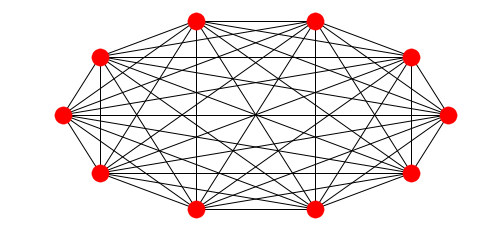

In [51]:
plt.figure(figsize=(6,3))
nx.draw_circular(g_comp)

### 完全２部グラフ

In [0]:
g_comp_bi = nx.complete_bipartite_graph(5,5)

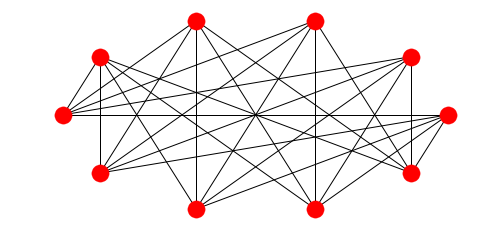

In [186]:
plt.figure(figsize=(6,3))
nx.draw_circular(g_comp_bi)

### barbell graph

In [0]:
g_bar = nx.barbell_graph(5,3)

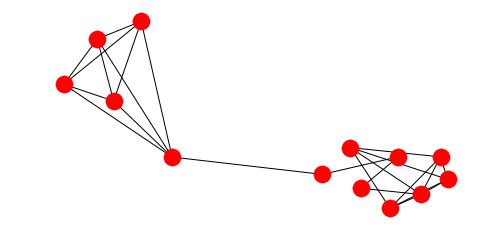

In [93]:
plt.figure(figsize=(6,3))
nx.draw(g_bar, pos=nx.spring_layout(g_lolli,k=1.0001))

### lollipop graph

In [0]:
g_lolli = nx.lollipop_graph(8,5)

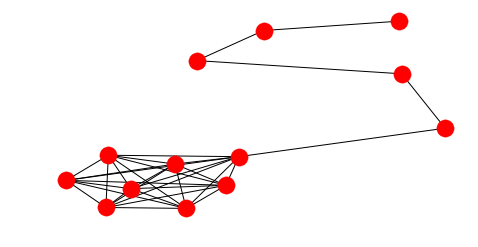

In [86]:
plt.figure(figsize=(6,3))
nx.draw(g_lolli,pos=nx.spring_layout(g_lolli,k=1.05))

### 梯子グラフ

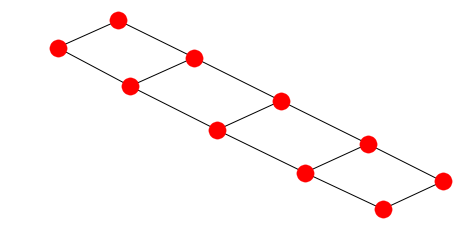

In [165]:
g_ladder = nx.ladder_graph(5)
plt.figure(figsize=(6,3))
nx.draw(g_ladder)

同様の関数として以下のようなものもある
* circular_ladder_graph(段数): ladder_graph の端同士を接続して環状にしたもの

### ２次元格子グラフ

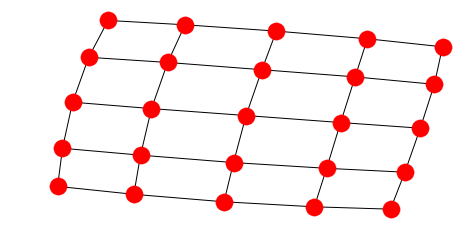

In [166]:
g_grid = nx.grid_2d_graph(5,5)
plt.figure(figsize=(6,3))
nx.draw(g_grid)

同様の関数として grid_graph もある。格子はリストで指定するため、

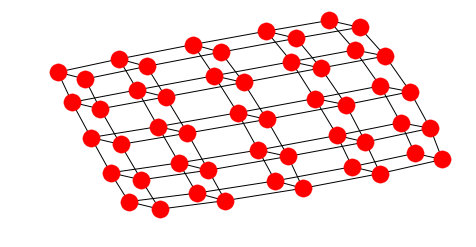

In [178]:
g_grid = nx.grid_graph([5,5,2])
plt.figure(figsize=(6,3))
nx.draw(g_grid)

### ランダムネットワーク


In [0]:
g_er = nx.erdos_renyi_graph(20, 0.3)

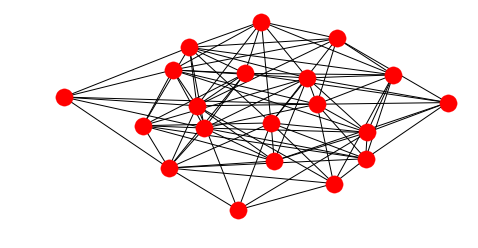

In [107]:
plt.figure(figsize=(6,3))
nx.draw(g_er)

### Small-World ネットワーク

In [0]:
g_small = nx.connected_watts_strogatz_graph(30, 2, 1)

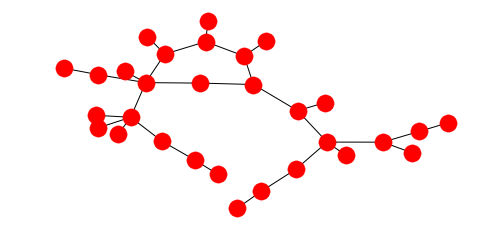

In [110]:
plt.figure(figsize=(6,3))
nx.draw(g_small)

### Scale-Free ネットワーク

In [0]:
g_sf = nx.barabasi_albert_graph(20, 2)

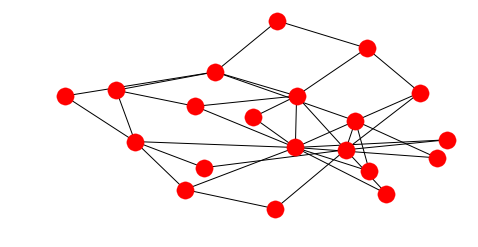

In [114]:
plt.figure(figsize=(6,3))
nx.draw(g_sf)

### random_lobster

In [0]:
g_rl = nx.random_lobster(20, 0.2, 0.9)

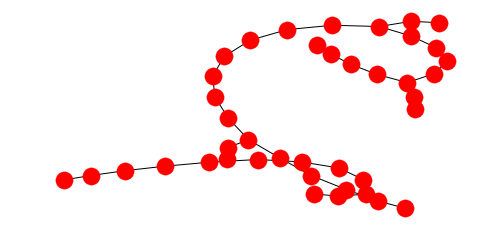

In [141]:
plt.figure(figsize=(6,3))
nx.draw(g_rl)

### 参考
これら以外にも、様々なネットワーク生成モデルが実装されているので、[NetworkX のドキュメント](https://networkx.github.io/documentation/stable/reference/generators.html) を参考にしてください


## サンプルデータの呼び出し

### Zachary’s Karate club graph

ネットワーク分析で著名な空手クラブの人間関係のデータ。ただし、属性データなどはなさそうなので、分析に使うには注意が必要

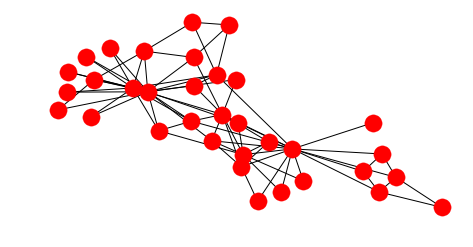

In [142]:
g_karate = nx.karate_club_graph()
plt.figure(figsize=(6,3))
nx.draw(g_karate)

### Davis Southern women social network.

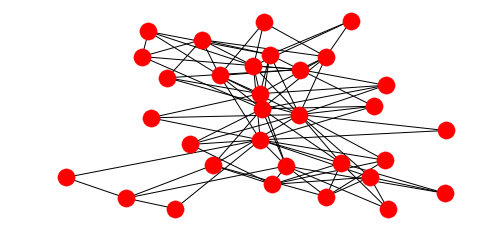

In [148]:
g_davis = nx.davis_southern_women_graph()
plt.figure(figsize=(6,3))
nx.draw(g_davis)

### Florentine families graph.

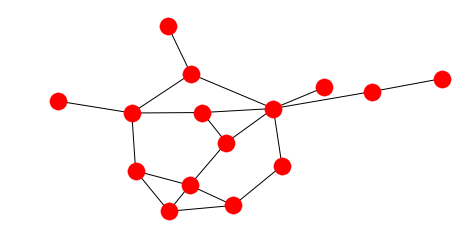

In [149]:
g_floren = nx.florentine_families_graph()
plt.figure(figsize=(6,3))
nx.draw(g_floren)

 <a name="tutorial"/>
# チュートリアル
本節では、NetworkX のチュートリアルの内容を紹介します。

## グラフの作成

まず、空のグラフを作成してみましょう。NetworkX を利用するには networkx を import します。google colab には初めからこのモジュールがインストールされていますので、インストール作業は不要です。

In [0]:
import networkx as nx

G = nx.Graph()

In [209]:
print(G.nodes())

[]


グラフのインスタンスの宣言は Graph クラスを用います。

## ノードの追加

ノードの追加は add_node 関数で行います。これはノード一つだけ追加します。引数に入れた値は、ノードのラベルとなります。

In [0]:
G.add_node(2)

In [211]:
print(G.nodes())

[2]


複数のノードを加えるときには add_node_from 関数で行います。引数にはリストで与えます。

In [0]:
G.add_nodes_from([1,3])

In [213]:
print(G.nodes)

[2, 1, 3]


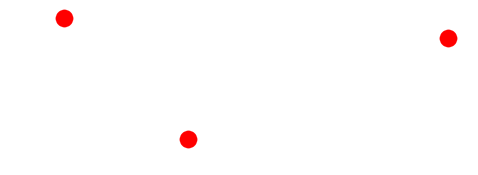

In [217]:
import matplotlib.pyplot as plt
plt.figure(figsize=(6,2))
nx.draw(G)

ノードのみのネットワークなので、点が３つあるだけになります。

つづいて、すでにあるネットワークから、ノードだけを追加することもできます。その事例として、直線状のネットワークを生成する関数 path_graph を用いてネットワークを作成します。

In [0]:
H = nx.path_graph(10)

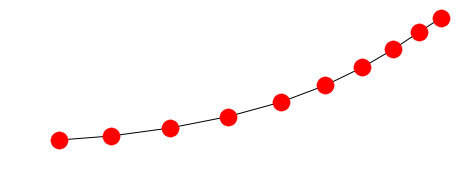

In [216]:
plt.figure(figsize=(6,2))
nx.draw(H)

In [230]:
print(nx.number_of_nodes(H))
print(H.nodes)

10
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]


追加するネットワークはノードを１０個持ったネットワークになります。これを add_nodes_from 関数を使うと以下のようになります

In [0]:
G.add_nodes_from(H)

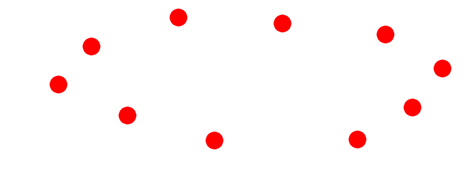

In [228]:
plt.figure(figsize=(6,2))
nx.draw(G)

In [231]:
print(nx.number_of_nodes(G))
print(G.nodes)

10
[2, 1, 3, 0, 4, 5, 6, 7, 8, 9]


上記のようについか出来ましたが、ラベルが重複しているノードは改めて追加されないようです。

続いて、add_node 関数を用いても追加できます。

In [0]:
G.add_node(H)

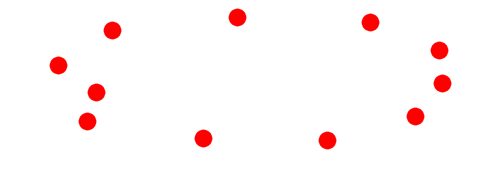

In [234]:
plt.figure(figsize=(6,2))
nx.draw(G)

In [236]:
print(nx.number_of_nodes(G))
print(G.nodes)

11
[2, 1, 3, 0, 4, 5, 6, 7, 8, 9, <networkx.classes.graph.Graph object at 0x7fce05843dd8>]


先ほどの add_nodes_from と異なるのは、ネットワークを構成するノードの数が一つ増えていることです。見た目だとそのままですが、ノードの一覧を表示した結果をみると、ノードの一つがグラフデータになっていることがわかります。つまり、NetworkX のグラフ表現ではグラフのなかのグラフを表現することが可能であるということを意味します。

## Edge の追加

エッジの追加は add_edge 関数を用います。エッジを追加したいノードのラベルを２つ指定することでエッジが追加できます。

In [0]:
G.add_edge(1,2)

In [239]:
nx.number_of_edges(G)

1

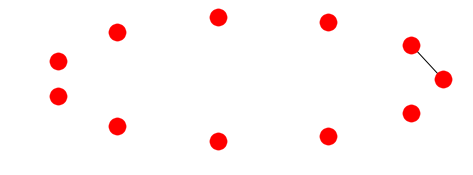

In [240]:
plt.figure(figsize=(6,2))
nx.draw_circular(G)

ノードの追加と同じく、add_edges_from 関数を使用して複数のエッジをまとめて追加することもできます。引数には、タプルで指定したノードの組み合わせのリストという形式で追加します。

In [0]:
G.add_edges_from([(1,2), (1,3)])

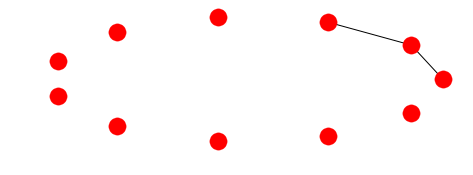

In [243]:
plt.figure(figsize=(6,2))
nx.draw_circular(G)

さらに、ノードの時と同様に既存のネットワークからエッジだけを追加することも可能です。先ほど作成した線状のネットワーク H を add_edges_from 関数を用いて追加すると次のようになります。ノードの時と異なるのは、グラフから edges を呼び出す必要がある点です。

In [0]:
G.add_edges_from(H.edges)

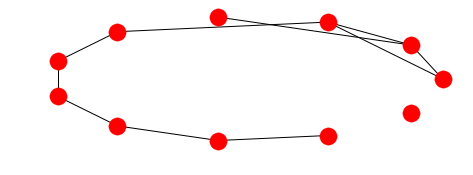

In [246]:
plt.figure(figsize=(6,2))
nx.draw_circular(G)

## ネットワークの削除

ネットワークを空に戻すには、clear 関数を用いれば空になります。

In [0]:
G.clear()

## ネットワーク追加の際の注意点

ネットワークはノードを明示的に追加しなくても、リンクを指定するだけでもノードとリンクが追加されます。

そして、すでにネットワーク内に存在する、ノードやリンクを再度追加しても、その処理は無視されます。

In [0]:
G.add_edges_from([(1,2),(1,3)])

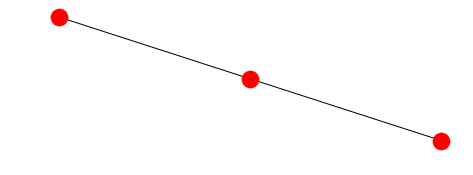

In [348]:
plt.figure(figsize=(6,2))
nx.draw(G)

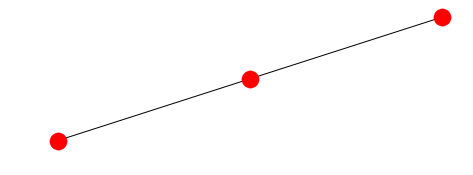

In [349]:
G.add_node(1)
plt.figure(figsize=(6,2))
nx.draw(G)

None


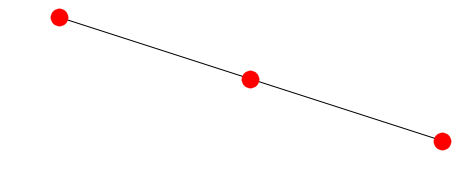

In [341]:
G.add_edge(1,2)
plt.figure(figsize=(6,2))
a = nx.draw(G)
print(a)

ノードのラベルは数値だけでなく、文字列を指定することも可能です。

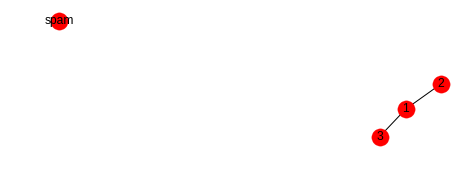

In [350]:
G.add_node("spam")
plt.figure(figsize=(6,2))
nx.draw(G, with_labels=True)

そして、そのラベルには日本語など英語以外を入れることができます。ただし、図にラベルを表示する際には、フォントを指定する必要があります。

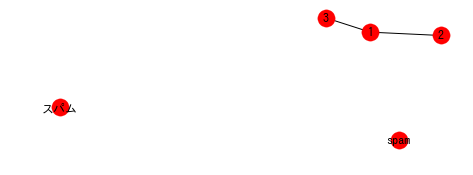

In [351]:
G.add_node("スパム")
plt.figure(figsize=(6,2))
nx.draw(G, with_labels=True, font_family='IPAGothic')

ノードを追加するときに文字列を割り当てるときに注意が必要なのは、add_notes_from 関数を使用すると、以下のように文字がひとつづつノードのラベルに割り当てられて困ったことになります。

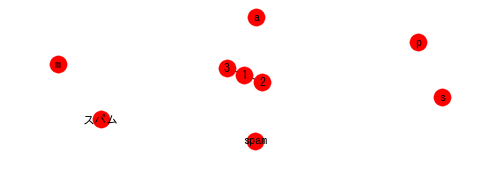

In [352]:
G.add_nodes_from("smap")
plt.figure(figsize=(6,2))
nx.draw(G, with_labels=True, font_family="IPAGothic")

## ネットワークの状況を確認する

ネットワークに含まれるノードとリンクを知るには、それぞれ nodes, edges で取得できます

In [270]:
print(G.nodes)
print(G.edges)

[1, 2, 3, 'spam', 'スパム', 's', 'm', 'a', 'p']
[(1, 2), (1, 3)]


そして、ノードの近接関係(ノード間のつながりの関係)や次数(リンクの数)などのも、以下のように確認できます

In [274]:
print(G.adj[1]) # or G.neighbors(1)
print(G.degree[1])

{2: {}, 3: {}}
2


## ノードやリンクの削除

ネットワークからノードやリンクの削除はノードの追加の時の add の代わりに remove とすることで可能です。

In [275]:
G.remove_node(2)
G.remove_nodes_from("spam")
print(G.nodes)

[1, 3, 'spam', 'スパム']


In [276]:
G.remove_edge(1,3)
print(G.edges)

[]


## エッジや近接ノードの取得

In [0]:
G.add_edge(1,2)

In [278]:
G[1]　# G.adj[1] と同じ

AtlasView({2: {}})

In [283]:
G.edges[1,2]

{}

戻り値は空になってますが、これは、エッジに属性が設定されていないためです。

また、リンクの存在しないノード間を指定するとエラーになるので、エッジが存在するかどうかは確認しましょう。

## エッジの属性の指定

In [0]:
G.add_edge(1,3)
G[1][3]['color'] = 'red'
G.edges[1,2]['color'] = 'blue'

In [285]:
print(G[1][2])
print(G.edges[1,3])

{'color': 'blue'}
{'color': 'red'}


つづいて、リンクに重みを付けて、それにアクセスする方法について説明します。

重み付きのリンクはグラフを作成後 add_weighted_edge, add_weighted_edges_from 関数をもちいておこないます

In [0]:
FG = nx.Graph()
FG.add_weighted_edges_from([(1, 2, 0.125),(1, 3, 0.75), (1, 4, 1.2), (3, 4, 0.375)])

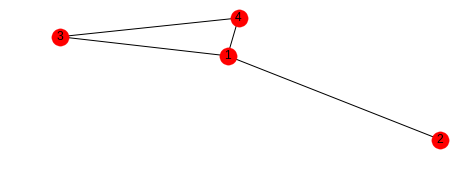

In [333]:
plt.figure(figsize=(6,2))
nx.draw(FG,with_labels=True)

近接関係から、weight に関する情報を取得する方法 adj から items 関数で取得する。

In [289]:
for n, nbrs in FG.adj.items():
  for nbr, eattr in nbrs.items():
    weight = eattr['weight']
    if weight < 0.5:
      print('({}, {}, {:.3f})'.format(n, nbr, weight))

(1, 2, 0.125)
(2, 1, 0.125)
(3, 4, 0.375)
(4, 3, 0.375)


ただし、この手法では、双方向リンクの場合同じリンクを重複して受け取ることがある。

そのため、edges から 'weight' の属性情報だけを data 関数を用いて取得するという方法もある。

In [290]:
for (u, v, wt) in FG.edges.data('weight'):
  if wt < 0.5:
    print('({}, {}, {:.3f})'.format(u, v, weight))

(1, 2, 0.375)
(3, 4, 0.375)


この方法だと、重複したリンクは省かれる。

## グラフ、ノード、リンクへの属性の追加

グラフの属性の追加は、新しいインスタンスを生成するときに指定できる。そして、その情報は graph 変数に記述されている。

In [291]:
G = nx.Graph(day='Friday')
G.graph

{'day': 'Friday'}

そして、その属性の情報は、辞書データ的な書き方で修正できる。

In [293]:
G.graph['day'] = 'Monday'
G.graph

{'day': 'Monday'}

### ノードの属性

ノードの属性もノードの追加の時に引数として指定できる。

In [0]:
G.add_node(1, time='5pm')
G.add_nodes_from([3], time='2pm')

In [301]:
print(G.nodes[1])
G.nodes[1]['room'] = 744
print(G.nodes.data())

{'time': '5pm', 'room': 744}
[(1, {'time': '5pm', 'room': 744}), (3, {'time': '2pm'})]


### リンクの属性

リンクの属性も基本的にノードと同じであるが、いろんな形で属性が付与できるので、好きな方法でやればいいとおもう。

In [0]:
G.add_edge(1,2, weight=1.5)
G.add_edges_from([(3,4), (4,5)], color="red")

In [303]:
G.add_edges_from([(1,2,{'color':'blue'}),(2,3,{'weight':8})])
print(G.edges.data())

[(1, 2, {'weight': 1.5, 'color': 'blue'}), (3, 4, {'color': 'red'}), (3, 2, {'weight': 8}), (4, 5, {'color': 'red'})]


In [304]:
G[1][2]['weight'] = 3
print(G.edges.data())

[(1, 2, {'weight': 3, 'color': 'blue'}), (3, 4, {'color': 'red'}), (3, 2, {'weight': 8}), (4, 5, {'color': 'red'})]


In [305]:
G.edges[3,4]['weight'] = 4.2
print(G.edges.data())

[(1, 2, {'weight': 3, 'color': 'blue'}), (3, 4, {'color': 'red', 'weight': 4.2}), (3, 2, {'weight': 8}), (4, 5, {'color': 'red'})]


## 有向グラフ

つづいて、有向グラフの利用の仕方について学びましょう。有向グラフは、DiGraph クラスで宣言します。

In [0]:
DG = nx.DiGraph()

リンクの追加などは、無向グラフと変わりません。

In [0]:
DG.add_weighted_edges_from([(1, 2, 0.5), (3, 1, 0.75)])

しかしながら、有向グラフでは、リンクに方向があるため、入力次数(in degree)、出力次数(out degree)と異なる次数が存在ます。

In [310]:
DG.out_degree(1, weight='weight')

0.5

In [311]:
DG.in_degree(1, weight='weight')

0.75

そして、degree 関数を使用すると、双方向の次数に関して取得します。

In [313]:
print(DG.degree(1))
print(DG.degree(1, weight='weight'))

2
1.25


リンクに方向があるということは、近接ノードの関係も、無向グラフとはことなります。

In [318]:
print(list(DG.neighbors(1)))
print(list(DG.successors(1)))

[2]
[2]


## 多重リンクグラフ(Multigraphs)

Multigraphs クラスでは、同じノード間に複数のリンクを設定することができます。下記の例では(1,2)

In [319]:
MG = nx.MultiGraph()
MG.add_weighted_edges_from([(1, 2, 0.5), (1, 2, 0.75), (2, 3, 0.5)])
MG.degree(weight='weight')

MultiDegreeView({1: 1.25, 2: 1.75, 3: 0.5})

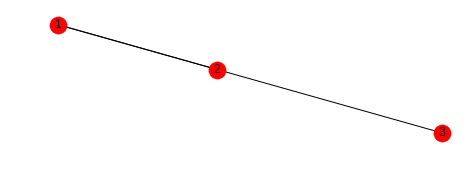

In [332]:
plt.figure(figsize=(6,2))
nx.draw(MG, with_labels=True)

上記の図では見にくいですが、1, 2 の間に２本のリンクが描画されています。これらが、きちんと２本存在することを図で確認するには、他の描画アルゴリズムを用いる必要があります。

In [323]:
nx.shortest_path(MG, 1, 3)

[1, 2, 3]

In [0]:
GG = nx.Graph()
for n, nbrs in MG.adjacency():
  for nbr, edict in nbrs.items():
    minvalue = min([d['weight'] for d in edict.values()])
    GG.add_edge(n, nbr, weight = minvalue)

In [321]:
nx.shortest_path(GG, 1, 3)

[1, 2, 3]

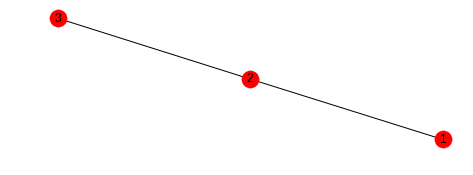

In [327]:
plt.figure(figsize=(6,2))
nx.draw(GG,pos, with_labels=True)

## グラフの描画

グラフの描画には matplotlib.pyplot を用います。そのため、描画のサイズ、エリアの指定などは matplotlib.pyplot で行います。

グラフの描画はアルゴリズムと結びついた関数がありますが、ここでは draw 関数を用います。グラフをそのまま描画すると、ラベルの表示はされないため、引数に with_labels を加えておきます。その際、ラベルの中に英語以外の言語が混ざっているならば、フォントの指定が必要となります。

二つ目のグラフの描画には draw_shell 関数が用いられていますが、これは階層的に？描画する関数になります？（適当）

In [0]:
import matplotlib.pyplot as plt

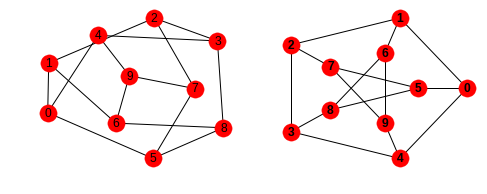

In [353]:
G = nx.petersen_graph()
plt.figure(figsize=(8,3))
plt.subplot(121)
nx.draw(G, with_labels=True, font_wight='bold')
plt.subplot(122)
nx.draw_shell(G, nlist=[range(5,10),range(5)], with_labels=True, font_weight='bold')

# 参考
> PythonでQiitaタグのネットワークを可視化する https://qiita.com/mitch0807/items/0314a793192b69f5771c    
> NetworkXでネットワークの特徴量を計算する https://qiita.com/Hiroyuki1993/items/ac3ad3029eba8d4b6eb6

> NetworkX Reference https://networkx.github.io/documentation/stable/reference/index.html